# **Fair Minimum Representation Clustering with Column Generation**

In [19]:
import numpy as np
#import cvxpy as cp
#%pip install repliclust
#%pip install -i https://pypi.gurobi.com gurobipy;
import gurobipy as gp

In [21]:
from gurobipy import GRB
from repliclust import set_seed, Archetype, DataGenerator
import matplotlib.pyplot as plt

**Master problem**

\begin{align*}
&\textbf{min} & \sum_{k}r_kz_k & \\
&\textbf{s.t.} & \sum_{k \in C} s_{i,k}z_k &= 1, \forall i\\
&  \quad & \sum_{k \in C} t_{g,k}z_k &\geq \beta_g, \forall g \\
&  \quad & \sum_{k \in C} z_k &= K \\
&  \quad & z_k &\in \{0,1\}
\end{align*}

$k$: the $k$-th cluster of points

$g$: the group of points with label $g$

$C$: the set of all clusters

$r_k$ : sum of squared 2-norm of distances between points in cluster $k$ and the center of cluster $k$.

$z_k$ : decision variables that determine if a cluster is selected.

$\beta_g$: least number of $\alpha$ represented cluster for group $g$.

$s_{i,k}$: parameters that determine if point $i$ is in cluster $k$.

$t_{g,k}$: parameters that determine if cluster $k$ is $\alpha$-represented for group $g$.

**Pricing problem**

\begin{align}
&\textbf{min} &\space (\sum_{\forall i} r_i - \sum_{\forall i} \mu_is_i &- \sum_{\forall g} \lambda_gt_g)\\
&\textbf{s.t.} &\sum_{\forall i} q_{g,i}s_i + M(1-t_g) &\geq \alpha_g\sum_{\forall i} s_i, \forall g\\
& & r_i + M(1-s_i) &\geq ||x_i - c||_2^2, \forall i\\
& & u \geq \sum_{\forall i} s_i &\geq l, \forall i\\
& & r_i \geq 0, s_i, t_g \in \{0,1\}, c &\in \mathbb{R}^n
\end{align}

$s_i$ : decision variables determining if point $i$ is in the generated cluster.

$t_g$ : decision variables determining if the generated cluster is $\alpha$-represented for group $g$.

$r_i$ : decision variables for the contribution of squared 2-norm of point $i$ to the sum of distances between points and the center of cluster in the new cluster.

$c$ : decision variable for the center of the new cluster.

$\mu_i$ : dual variables for constraints \ref{eq:master-cons-1}.

$\lambda_g$ : dual variables for constraints \ref{eq:master-cons-2}.

$q_{g,i}$ : parameters that determine if point $i$ is in group $g$.

$u$ : upper bound for the number of points in a cluster

$l$ : lower bound for the number of points in a cluster

In [63]:
def master_optimize(model,m,n,l,Z):
    # Solve the problem
    model.optimize()

    # Print objective value
    print('Objective:', model.objVal)

    # Print variable values
    for i, var in enumerate(model.getVars()):
        print(f"{var.varName} = {var.x}")

    # Print dual variables
    print("Dual values:")
    for constr in model.getConstrs():
        print(f"{constr.ConstrName}: {constr.Pi}")

    constraints = list(model.getConstrs())

    mu = [cons_i.Pi for cons_i in constraints[:n]]

    lmd = [cons_g.Pi for cons_g in constraints[n:n+l]]

    delta = constraints[n+l].Pi

    # for cons_i in constraints[:n]:
    #   mu.append(cons_i.Pi)

    # lmd = []
    # for cons_g in constraints[n:n+l]:
    #   lmd.append(cons_g.Pi)

    optimal_values_Z = [int(Z[k].x) for k in range(m)]

    return model, mu, lmd, model.objVal, optimal_values_Z, delta, Z

In [84]:
def master_warm_start(model, Z, m, n, l, new_r_list, optimal_values_s_list, optimal_values_t_list):
  for solNum in range(len(new_r_list)):
    new_r = new_r_list[solNum]
    constrs = model.getConstrs()
    print(constrs)
    print("n,l",n,l)
    optimal_values_s = optimal_values_s_list[solNum].copy()
    for i in optimal_values_t_list[solNum]:
      optimal_values_s.append(i) # new column
    optimal_values_s.append(1)
    print(optimal_values_s)
    print(constrs[:n+l+1])
    new_z = model.addVar(vtype=GRB.CONTINUOUS, name="Z["+str(m)+"]", column = gp.Column(optimal_values_s,constrs[:n+l+1]))
    Z += [new_z]
    model.setObjective(model.getObjective() + new_z * new_r, GRB.MINIMIZE)
  return master_optimize(model,m,n,l,Z)

In [85]:
def solve_master_problem_gurobi(n, m, l, r, s, t, beta, K):
    # Create a Gurobi model
    model = gp.Model("MasterProblem")
    #model.Params.LogToConsole = 0

    # Create decision variables
    Z = []
    for i in range(m):
       Z.append(model.addVar(vtype=GRB.CONTINUOUS, name="Z"))
    #Z = model.addMVar(m, vtype=GRB.CONTINUOUS, name="Z")

    # Set objective function
    model.setObjective(gp.quicksum(Z[i] * r[i] for i in range(m)), GRB.MINIMIZE)

    # Constraints
    constraint1 = []
    constraint2 = []

    for i in range(n):
      constraint1.append(model.addConstr(gp.quicksum(s[k][i] * Z[k] for k in range(m)) == 1, name="Constraint1_"+str(i)))

    for g in range(l):
      constraint2.append(model.addConstr(gp.quicksum(t[g][k] * Z[k] for k in range(m)) >= beta[g], name="Constraint2_"+str(g)))

    constraint_3 = [model.addConstr(gp.quicksum(Z[k] for k in range(m)) == K, name="Constraint3")]

    # for k in range(m):
    #     model.addConstr(Z[k] <= 1, name="Constraint4_"+str(k))
    #     model.addConstr(Z[k] >= 0, name="Constraint5_"+str(k))

    return master_optimize(model,m,n,l,Z)

In [74]:
def solve_master_problem_integer(n, m, l, r, s, t, beta, K):
    # Create a Gurobi model
    model = gp.Model("MasterProblemInteger")
    #model.Params.LogToConsole = 0

    # Create decision variables
    Z = model.addMVar(m, vtype=GRB.BINARY, name="Z")

    # Set objective function
    model.setObjective(gp.quicksum(Z[i] * r[i] for i in range(m)), GRB.MINIMIZE)

    # Constraints
    constraint1 = []
    constraint2 = []

    for i in range(n):
      constraint1.append(model.addConstr(gp.quicksum(s[k][i] * Z[k] for k in range(m)) == 1, name="Constraint1_"+str(i)))

    for g in range(l):
      constraint2.append(model.addConstr(gp.quicksum(t[g][k] * Z[k] for k in range(m)) >= beta[g], name="Constraint2_"+str(g)))

    constraint_3 = [model.addConstr(gp.quicksum(Z[k] for k in range(m)) == K, name="Constraint3")]

    # Solve the problem
    model.optimize()

    # Print objective value
    print('Objective:', model.objVal)

    # Print variable values
    for i, var in enumerate(model.getVars()):
        print(f"{var.varName} = {var.x}")

    optimal_values_Z = [int(Z[k].x) for k in range(m)]

    return model.objVal, optimal_values_Z

In [93]:
def pricing_warm_start(model,r_var,mu,s_var,lmd,t_var,delta,n,l,cx_var,cy_var):
  objective = gp.quicksum(r_var[i] for i in range(n)) \
                - gp.quicksum(mu[i] * s_var[i] for i in range(n)) \
                - gp.quicksum(lmd[g] * t_var[g] for g in range(l)) \
                - delta
  model.setObjective(objective,GRB.MINIMIZE)
  model.optimize()
  # Print objective value
  print('Objective:', model.objVal)

  print("Number of solutions", model.SolCount)
  nSolutions = model.SolCount

  objectives = []
  optimal_values_s = []
  optimal_values_r = []
  optimal_values_t = []
  optimal_center = []

  for e in range(nSolutions):
        print("Solution Number",e)
        model.setParam(GRB.Param.SolutionNumber, e)
        print("Objective", model.PoolObjVal)
        objectives.append(model.PoolObjVal)
        # Print variable values
        for var in model.getVars():
          print(f"{var.varName} = {var.Xn}")

        optimal_values_s.append([int(np.round(s_var[i].Xn)) for i in range(n)])
        optimal_values_r.append([float(r_var[i].Xn) for i in range(n)])
        optimal_values_t.append([int(np.round(t_var[g].Xn)) for g in range(l)])
        optimal_center.append((cx_var.x,cy_var.Xn))

  return objectives,optimal_values_s, optimal_values_r, optimal_values_t, optimal_center

In [76]:
def solve_pricing_problem_gurobi(n, l, r, q, alpha, beta, delta, K, M, x, y, mu, lmd, lower, upper):
    # Create a Gurobi model
    model = gp.Model("PricingProblem")
    model.Params.PoolSearchMode = 2
    model.Params.PoolSolutions = 10
    #model.Params.LogToConsole = 0

    # Create decision variables
    r = model.addMVar(n, vtype=GRB.CONTINUOUS, name="R")
    s = model.addMVar(n, vtype=GRB.BINARY, name="S")
    t = model.addMVar(l, vtype=GRB.BINARY, name="t")
    cx = model.addVar(vtype=GRB.CONTINUOUS, lb = -100, name="cx")
    cy = model.addVar(vtype=GRB.CONTINUOUS, lb = -100, name="cy")

    # Objective function

    objective = gp.quicksum(r[i] for i in range(n)) \
                - gp.quicksum(mu[i] * s[i] for i in range(n)) \
                - gp.quicksum(lmd[g] * t[g] for g in range(l)) \
                - delta
    model.setObjective(objective , GRB.MINIMIZE)

    # Constraints
    constraints = []

    for g in range(l):
      constraints.append(model.addConstr(gp.quicksum(q[g][i] * s[i] for i in range(n)) + M*(1-t[g]) >= alpha * gp.quicksum(s[i] for i in range(n)), name="Constraint1"))

    for i in range(n):
      constraints.append(model.addConstr(r[i] + M*(1-s[i]) >= (x[i] - cx)**2 + (y[i] - cy)**2, name="Constraint2"))
      constraints.append(model.addConstr(r[i] >= 0, name="Constraint3"))

    constraints.append(model.addConstr(gp.quicksum(s[i] for i in range(n)) >= lower, name="Constraint3"))
    constraints.append(model.addConstr(gp.quicksum(s[i] for i in range(n)) <= upper, name="Constraint4"))

    # Solve the problem
    model.optimize()

    # Print objective value
    print('Objective:', model.objVal)

    print("Number of solutions", model.SolCount)
    nSolutions = model.SolCount


    for e in range(nSolutions):
          print("Solution Number",e)
          model.setParam(GRB.Param.SolutionNumber, e)
          print("Objective", model.PoolObjVal)
          # Print variable values
          for var in model.getVars():
            print(f"{var.varName} = {var.Xn}")

    # Print variable values
    for var in model.getVars():
      print(f"{var.varName} = {var.Xn}")

    # Print constraints
    # for constr in constraints:
    #   print(constr)

    optimal_values_s = [int(np.round(s[i].x)) for i in range(n)]
    optimal_values_r = [float(r[i].x) for i in range(n)]
    optimal_values_t = [int(np.round(t[g].x)) for g in range(l)]
    optimal_center = (cx.x,cy.x)

    return model, [model.objVal], [optimal_values_s], [optimal_values_r], [optimal_values_t], [optimal_center], r, s, t, cx, cy

In [67]:
def t_value_correction(new_cluster,l,q,alpha,optimal_values_t):
  new_cluster_size = sum(new_cluster)
  new_cluster_arr = np.array(new_cluster)
  for i in range(l):
    count = np.sum(new_cluster_arr & np.array(q[i]))
    if count >= alpha * new_cluster_size:
      if optimal_values_t[i] == 0:
        print("Warning: t value not correctly calculated")
        optimal_values_t[i] = 1

In [97]:
def main_loop(iterations,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,x,y,optimal_centers):
  reduced_cost = 1
  counter = 1
  master_model = None
  pricing_model = None
  Z = None
  objectives = []
  while counter < iterations:
    print("Iteration #"+str(counter))
    print("s:",s)
    print("r:",r)
    print("t:",t)
    counter += 1
    if not master_model:
      master_model, mu, lmd, masterobj, optimal_values_Z, delta, Z = solve_master_problem_gurobi(n, m, l, r, s, t, beta, K)
      objectives.append(masterobj)
    else:
      print("Master problem warm start")
      master_model, mu, lmd, masterobj, optimal_values_Z, delta, Z = master_warm_start(master_model, Z, m, n, l, new_r, optimal_values_s, optimal_values_t)
      objectives.append(masterobj)
    
    if not pricing_model:
      pricing_model, reduced_cost, optimal_values_s, optimal_values_r, optimal_values_t, optimal_center,r_var, s_var, t_var, cx_var, cy_var = solve_pricing_problem_gurobi(n, l, r, q, alpha, beta, delta, K, M, x, y, mu, lmd, lower, upper)
    else:
      reduced_cost, optimal_values_s, optimal_values_r, optimal_values_t, optimal_center = pricing_warm_start(pricing_model,r_var,mu,s_var,lmd,t_var,delta,n,l,cx_var,cy_var)
    
    new_r = []
    repeat_check = []
    print("Reduced Cost", reduced_cost)
    print("Set of Solutions", optimal_values_s)
    if reduced_cost[0] >= -1e-2:
        print("Terminate")
        print("Number of iterations", counter)
        print("Objective:",masterobj)
        print("Z:")
        print(optimal_values_Z)
        print("s:")
        print(s)
        print("Clusters:")
        for i in range(len(s)):
          if optimal_values_Z[i] > 0:
            print(s[i])
        return s, r, t, masterobj, optimal_values_Z, optimal_centers, objectives
    for solNum in range(len(reduced_cost)):
      print("Check Solution Number", solNum)
      if optimal_values_s[solNum] in repeat_check or optimal_values_s[solNum] in s:
        continue
      repeat_check.append(optimal_values_s[solNum])
      xc = 0
      yc = 0
      size = sum(optimal_values_s[solNum])
      for j in range(len(optimal_values_s[solNum])):
        if optimal_values_s[solNum][j] == 1:
          xc += x[j]
          yc += y[j]
      xc = xc / size
      yc = yc / size
      dist = 0
      for j in range(len(optimal_values_s[solNum])):
        if optimal_values_s[solNum][j] == 1:
          dist += (xc - x[j]) ** 2 + (yc - y[j]) ** 2
      optimal_centers.append((xc,yc))
      print("New cluster found")
      print(optimal_values_s[solNum])
      print("New optimal_values_t")
      print(optimal_values_t[solNum])
      s.append(optimal_values_s[solNum])
      new_r.append(dist)
      r.append(dist)
      t_value_correction(optimal_values_s[solNum],l,q,alpha,optimal_values_t[solNum])
      for g in range(l):
        t[g].append(optimal_values_t[solNum][g])
      m += 1

  #masterobj, optimal_values_Z = solve_master_problem_integer(n, m, l, r, s, t, beta, K)

  return s, r, t, masterobj, optimal_values_Z, optimal_centers, objectives
  

In [99]:
K = 2
n = 5
m = 2
l = 2
r = [0.5, 8/3]
beta = [1,1]
#              A, B, C, D, E
s =          [[1, 1, 0, 0, 0],
              [0, 0, 1, 1, 1]]
t =          [[1, 0],
              [0, 1]]
alpha = 2/3
M = 1e3
q = [[1, 1, 0, 0, 0],[0, 0, 1, 1, 1]]
lower = 2
upper = n
x = [0,0,0,-1,1]
y = [1,0,-1,0,0]

s, r, t, masterobj, optimal_values_Z, optimal_centers, objectives = main_loop(20,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,x,y,[])

Iteration #1
s: [[1, 1, 0, 0, 0], [0, 0, 1, 1, 1]]
r: [0.5, 2.6666666666666665]
t: [[1, 0], [0, 1]]
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (win64 - Windows 11+.0 (22631.2))

CPU model: Intel(R) Core(TM) i7-8550U CPU @ 1.80GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 8 rows, 2 columns and 9 nonzeros
Model fingerprint: 0x482b5ff2
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [5e-01, 3e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+00]
Presolve removed 8 rows and 2 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.1666667e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds (0.00 work units)
Optimal objective  3.166666667e+00
Objective: 3.1666666666666665
Z = 1.0
Z = 1.0
Dual values:
Constraint1_0: 0.5
Constraint1

In [33]:
K = 2
n = 5
m = 6
l = 2
r = [0.5, 8/3, 1, 0.5, 1, 1]
beta = [1,1]
#              A, B, C, D, E
s =          [[1, 1, 0, 0, 0],
              [0, 0, 1, 1, 1],
              [1, 0, 0, 0, 1],
              [0, 1, 0, 0, 1],
              [0, 0, 1, 0, 1],
              [0, 0, 1, 1, 0]]
t =          [[1, 0, 0, 0, 0, 0],
              [0, 1, 0, 0, 1, 1]]
alpha = 2/3
M = 1e3
q = [[1, 1, 0, 0, 0],[0, 0, 1, 1, 1]]
lower = 2
upper = n
x = [0,0,0,-1,1]
y = [1,0,-1,0,0]

main_loop(8,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,x,y,[])

Iteration #1
s: [[1, 1, 0, 0, 0], [0, 0, 1, 1, 1], [1, 0, 0, 0, 1], [0, 1, 0, 0, 1], [0, 0, 1, 0, 1], [0, 0, 1, 1, 0]]
r: [0.5, 2.6666666666666665, 1, 0.5, 1, 1]
t: [[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1]]
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (win64 - Windows 11+.0 (22631.2))

CPU model: Intel(R) Core(TM) i7-8550U CPU @ 1.80GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 8 rows, 6 columns and 23 nonzeros
Model fingerprint: 0x4934ac69
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [5e-01, 3e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+00]
Presolve removed 8 rows and 6 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.1666667e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds (0.00 work units)
Optimal objective

Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (win64 - Windows 11+.0 (22631.2))

CPU model: Intel(R) Core(TM) i7-8550U CPU @ 1.80GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 9 rows, 14 columns and 27 nonzeros
Model fingerprint: 0x27b03901
Model has 5 quadratic constraints
Variable types: 7 continuous, 7 integer (7 binary)
Coefficient statistics:
  Matrix range     [3e-01, 1e+03]
  QMatrix range    [1e+00, 1e+00]
  QLMatrix range   [1e+00, 1e+03]
  Objective range  [7e-01, 2e+00]
  Bounds range     [1e+00, 1e+02]
  RHS range        [2e+00, 1e+03]
  QRHS range       [1e+03, 1e+03]
Presolve added 0 rows and 1 columns
Presolve removed 1 rows and 0 columns
Presolve time: 0.00s
Presolved: 8 rows, 15 columns, 36 nonzeros
Presolved model has 1 quadratic constraint(s)
Variable types: 8 continuous, 7 integer (7 binary)

Root relaxation: objective -4.108778e+00, 5 iterations, 0.00 seconds (0.00 work unit

C:\Users\PC\AppData\Local\Temp\ipykernel_19180\2594891900.py:16: DeprecationWarning: Model.display() is deprecated
  print (model.display())



     0     0   -3.41466    0    2   -0.50065   -3.41466   582%     -    0s
H    0     0                      -0.5006549   -3.41466   582%     -    0s
     0     0   -2.16667    0    -   -0.50065   -2.16667   333%     -    0s
     0     0   -2.16667    0    -   -0.50065   -2.16667   333%     -    0s
     0     0   -2.16667    0    2   -0.50065   -2.16667   333%     -    0s
     0     0   -2.16654    0    5   -0.50065   -2.16654   333%     -    0s
     0     0   -2.16625    0    5   -0.50065   -2.16625   333%     -    0s
     0     0   -2.15768    0    5   -0.50065   -2.15768   331%     -    0s
     0     0   -2.15695    0    5   -0.50065   -2.15695   331%     -    0s
     0     0   -1.98769    0    5   -0.50065   -1.98769   297%     -    0s
     0     0   -1.97933    0    5   -0.50065   -1.97933   295%     -    0s
     0     0   -1.96339    0    5   -0.50065   -1.96339   292%     -    0s
     0     0   -1.94467    0    6   -0.50065   -1.94467   288%     -    0s
     0     0   -1.91688 

([[1, 1, 0, 0, 0],
  [0, 0, 1, 1, 1],
  [1, 0, 0, 0, 1],
  [0, 1, 0, 0, 1],
  [0, 0, 1, 0, 1],
  [0, 0, 1, 1, 0],
  [0, 0, 0, 1, 1],
  [1, 1, 0, 0, 1],
  [0, 0, 0, 1, 1],
  [0, 0, 0, 1, 1],
  [0, 1, 0, 1, 1]],
 [0.5,
  2.6666666666666665,
  1,
  0.5,
  1,
  1,
  2.500654947891503,
  1.3333333347480343,
  2.4098399303777103,
  2.0,
  2.0],
 [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1]],
 2.3333333347480343,
 [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
 [(-0.01809624120643728, 0.5),
  (0.333334188500516, 0.33335505285019246),
  (0.13623428455612757, 0.43169455046404437),
  (4.36969594496807e-06, -8.413118624904168e-06),
  (4.36969594496807e-06, -8.413118624904168e-06),
  (5.970698834978833e-06, 0.0)],
 [3.1666666666666665,
  3.1666666666666665,
  2.3333333347480343,
  2.3333333347480343,
  2.3333333347480343,
  2.3333333347480343])

In [146]:
new_cluster = [0,0,1,1,0]
optimal_values_t = [0,0]

new_cluster_size = sum(new_cluster)
new_cluster_arr = np.array(new_cluster)
for i in range(l):
  count = np.sum(new_cluster_arr & np.array(q[i]))
  if count >= alpha * new_cluster_size:
    if optimal_values_t[i] == 0:
      print("t value not correctly calculated")
      optimal_values_t[i] = 1

optimal_values_t

t value not correctly calculated


[0, 1]

In [167]:
K = 2
n = 5
m = 5
l = 2
r = [0.5, 8/3, 1, 0.5, 1]
beta = [1,1]
#              A, B, C, D, E
s =          [[1, 1, 0, 0, 0],
              [0, 0, 1, 1, 1],
              [1, 0, 0, 0, 1],
              [0, 1, 0, 0, 1],
              [0, 0, 1, 1, 0]]
t =          [[1, 0, 0, 0, 0],
              [0, 1, 0, 0, 1]]
alpha = 2/3
M = 1e3
q = [[1, 1, 0, 0, 0],[0, 0, 1, 1, 1]]
lower = 2
upper = n
x = [0,0,0,-1,1]
y = [1,0,-1,0,0]

main_loop(20,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,x,y,[])

Iteration #1
s: [[1, 1, 0, 0, 0], [0, 0, 1, 1, 1], [1, 0, 0, 0, 1], [0, 1, 0, 0, 1], [0, 0, 1, 1, 0]]
r: [0.5, 2.6666666666666665, 1, 0.5, 1]
t: [[1, 0, 0, 0, 0], [0, 1, 0, 0, 1]]
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[rosetta2] - Darwin 23.2.0 23C71)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 8 rows, 5 columns and 19 nonzeros
Model fingerprint: 0x6bef1a88
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [5e-01, 3e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+00]
Presolve removed 8 rows and 5 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.1666667e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds (0.00 work units)
Optimal objective  3.166666667e+00
Objective: 3.1666666666666665
Z = 1.0
Z = 1.0
Z = 0.0
Z = 0.0
Z = 0

([[1, 1, 0, 0, 0],
  [0, 0, 1, 1, 1],
  [1, 0, 0, 0, 1],
  [0, 1, 0, 0, 1],
  [0, 0, 1, 1, 0],
  [1, 1, 0, 0, 1],
  [0, 0, 1, 0, 1]],
 [0.5, 2.6666666666666665, 1, 0.5, 1, 1.3333333635401876, 1.0000000375583464],
 [[1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1]],
 2.333333363540188,
 [0, 0, 0, 0, 1, 1, 0],
 [(0.3333116448788152, 0.3333116448788152),
  (0.49998638013347163, -0.4999870220913318),
  (0.500041835859919, 0.5001128183446137)],
 [3.1666666666666665, 2.333333363540188, 2.333333363540188])

In [168]:
K = 2
n = 5
m = 4
l = 2
r = [0.5, 8/3, 1, 0.5]
beta = [1,1]
#              A, B, C, D, E
s =          [[1, 1, 0, 0, 0],
              [0, 0, 1, 1, 1],
              [1, 0, 0, 0, 1],
              [0, 1, 0, 0, 1]]
t =          [[1, 0, 0, 0],
              [0, 1, 0, 0]]
alpha = 2/3
M = 1e4
q = [[1, 1, 0, 0, 0],[0, 0, 1, 1, 1]]
lower = 2
upper = n
x = [0,0,0,-1,1]
y = [1,0,-1,0,0]

main_loop(30,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,x,y,[])

Iteration #1
s: [[1, 1, 0, 0, 0], [0, 0, 1, 1, 1], [1, 0, 0, 0, 1], [0, 1, 0, 0, 1]]
r: [0.5, 2.6666666666666665, 1, 0.5]
t: [[1, 0, 0, 0], [0, 1, 0, 0]]
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[rosetta2] - Darwin 23.2.0 23C71)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 8 rows, 4 columns and 15 nonzeros
Model fingerprint: 0x124711ca
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [5e-01, 3e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 2e+00]
Presolve removed 8 rows and 4 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.1666667e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds (0.00 work units)
Optimal objective  3.166666667e+00
Objective: 3.1666666666666665
Z = 1.0
Z = 1.0
Z = 0.0
Z = 0.0
Dual values:
Constraint1_0: 0.0

([[1, 1, 0, 0, 0],
  [0, 0, 1, 1, 1],
  [1, 0, 0, 0, 1],
  [0, 1, 0, 0, 1],
  [0, 1, 1, 0, 0],
  [0, 0, 1, 1, 0],
  [0, 0, 1, 0, 1],
  [1, 1, 0, 1, 0],
  [0, 0, 0, 1, 1],
  [0, 1, 0, 1, 1]],
 [0.5,
  2.6666666666666665,
  1,
  0.5,
  0.5000000277018151,
  1.0,
  1.0000000007003105,
  1.3333333455644085,
  2.000000050710211,
  2.0],
 [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 1]],
 2.3333333462647188,
 [0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
 [(2.2139895769428918e-05, -0.49997579791870617),
  (-0.5, -0.5),
  (0.5000174152681965, -0.49999310546183),
  (-0.333282328975442, 0.33329477688055126),
  (-8.126953396235684e-07, 8.167011308969413e-07),
  (0.0, 0.0),
  (-0.3329840695656524, 0.3331930091234328)],
 [3.1666666666666665,
  3.1666666666666665,
  3.1666666666666665,
  3.1666666666666665,
  2.3333333462647188,
  2.3333333462647188,
  2.3333333462647188])



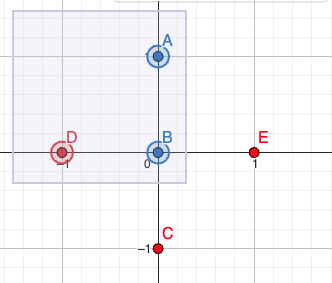

## Synthetic data for clustering

Generate initial clusters

In [20]:
n = 30
K = 5
set_seed(5)

archetype = Archetype(n_clusters=K, dim=2, n_samples=n,
                             aspect_ref=1, aspect_maxmin=1, radius_maxmin=1, max_overlap = 0.02, min_overlap = 0.01)
data_generator = DataGenerator(archetype=archetype)
X, Y, archetype = data_generator.synthesize()

# fig, ax = plt.subplots(figsize=(6,6), dpi=150)
# ax.scatter(X[:,0], X[:,1], c=Y, s=15, alpha=0.5, linewidth=1.0)
# plt.title("Synthetic Data from Archetype '"
#             + archetype.name + "'")
# plt.xlabel('X1')
# plt.ylabel('X2').set_rotation(0)
# plt.axis('equal');

Optimizing Cluster Centers: 100%|██████████| 300/300 [00:00<00:00, 9543.79it/s, Status=SUCCESS] 


In [21]:
clusters_assign_random = np.random.choice(list(range(K)), size=n)

xc = [0 for _ in range(K)]
yc = [0 for _ in range(K)]
cluster_size = [0 for _ in range(K)]

for i in range(n):
  k = int(clusters_assign_random[i])
  cluster_size[k] += 1
  xc[k] += X[i][0]
  yc[k] += X[i][1]

for k in range(K):
  xc[k] /= cluster_size[k]
  yc[k] /= cluster_size[k]

dist = [0 for _ in range(K)]

for i in range(n):
  k = int(clusters_assign_random[i])
  dist[k] += (X[i][0] - xc[k]) **2 + (X[i][1] - yc[k]) **2

centers = [(xc[i],yc[i]) for i in range(K)]

print(clusters_assign_random)
print(centers)
print(dist)

[2 3 4 2 0 0 0 3 2 3 4 4 1 3 1 3 0 4 3 2 1 2 1 4 1 0 3 3 2 4]
[(-3.062620968854156, 0.8672175311621878), (1.9670252254848772, 0.6600350973636699), (-1.1329982400188296, 1.0871870446660057), (0.527553441403384, 0.1844663638152814), (1.8435593973203357, -0.3603360209153062)]
[66.27891268387216, 94.48497345233913, 104.89616499560096, 210.70357754231958, 162.87169167261598]


In [178]:
# fig, ax = plt.subplots(figsize=(6,6), dpi=150)
# ax.scatter(X[:,0], X[:,1], c=clusters_assign_random, s=15, alpha=0.5, linewidth=1.0)
# ax.scatter(xc, yc, marker='P', c=list(range(K)), s=50, linewidth=1.0)

# plt.title("Initial Clusters")
# plt.xlabel('X1')
# plt.ylabel('X2').set_rotation(0)
# plt.axis('equal')

In [86]:
labels = np.random.choice([0,1,2], p= [0.1,0.2,0.7], size=n)

# fig, ax = plt.subplots(figsize=(6,6), dpi=150)
# ax.scatter(X[:,0], X[:,1], c=labels, s=15, alpha=0.5, linewidth=1.0)

# plt.title("Labels")
# plt.xlabel('X1')
# plt.ylabel('X2').set_rotation(0)
# plt.axis('equal')

In [87]:
clusters_random = [[0 for _ in range(n)] for _ in range(K)]
for i in range(n):
  k = int(clusters_assign_random[i])
  clusters_random[k][i] = 1
print(clusters_random)

[[0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0], [1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]


In [88]:
l = 3
q = [[0 for _ in range(n)] for _ in range(l)]
for i in range(n):
  label = int(labels[i])
  q[label][i] = 1
print(q)

[[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]]


In [89]:
alpha = 1/4
label_stats = [[0 for _ in range(K)] for _ in range(l)]
t = [[0 for _ in range(K)] for _ in range(l)]
for i in range(n):
  label = int(labels[i])
  k = int(clusters_assign_random[i])
  label_stats[label][k] += 1

print(label_stats)
print(cluster_size)

for i in range(l):
  for k in range(K):
    if label_stats[i][k] >= alpha * cluster_size[k]:
      t[i][k] = 1

print(t)

[[1, 0, 0, 1, 0], [1, 1, 0, 1, 0], [4, 4, 12, 2, 3]]
[6, 5, 12, 4, 3]
[[0, 0, 0, 1, 0], [0, 0, 0, 1, 0], [1, 1, 1, 1, 1]]


Helper functions

In [16]:
K = 3
n = 5
m = 2
l = 2
r = [0.5, 8/3]
beta = [1,1]
#              A, B, C, D, E
s =          [[1, 1, 0, 0, 0],
              [0, 0, 1, 1, 1]]
t =          [[1, 0],
              [0, 1]]
alpha = 2/3
M = 1e3
q = [[1, 1, 0, 0, 0],[0, 0, 1, 1, 1]]
lower = 1
upper = n
group_info = [{0,1},{2,3,4}]

obj,clusters,alpharep = solve_initial_feasible_solution(n, l, alpha, beta, K, M, lower, upper, group_info)

Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[rosetta2] - Darwin 23.2.0 23C71)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 19 rows, 21 columns and 87 nonzeros
Model fingerprint: 0xc5bbee38
Variable types: 0 continuous, 21 integer (21 binary)
Coefficient statistics:
  Matrix range     [3e-01, 1e+03]
  Objective range  [0e+00, 0e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+03]
Found heuristic solution: objective 0.0000000

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 0 

Optimal solution found (tolerance 1.00e-04)
Best objective 0.000000000000e+00, best bound 0.000000000000e+00, gap 0.0000%
Objective: 0.0
Z[0,0] = 0.0
Z[0,1] = 0.0
Z[0,2] = 1.0
Z[1,0] = 0.0
Z[1,1] = 1.0
Z[1,2] = 0.0
Z[2,0] = 0.0
Z[2,1] = 0.0
Z[2,2] = 1.0
Z[3,0] = 1.0
Z[3,1] = 0.0
Z[3,2] = 0.0
Z[4,0] = 0.0
Z[4,1] = 0.0
Z[

In [18]:
alpharep

array([[0., 1., 0.],
       [0., 0., 1.]])

In [14]:
clusters.T.astype(int).tolist()

[[0, 0, 1, 0, 1], [1, 1, 0, 1, 0]]

In [170]:
def initialize_clusters(X,K,l,alpha,beta,n,labels,M,lower,upper):
  #Set up labels info
  group_info = [set() for _ in range(l)]
  for i in range(n):
    group_info[int(labels[i])].add(i)
  
  #Initialize feasible solution
  obj,clusters,alpharep = solve_initial_feasible_solution(n, l, alpha, beta, K, M, lower, upper, group_info)

  clusters = clusters.T.astype(int).tolist()
  clusters_assign = [0 for _ in range(n)]
  for i,clus in enumerate(clusters):
    for j in range(n):
      if clus[j] == 1:
        clusters_assign[j] = int(i)

  #Calculate initial centers
  xc = [0 for _ in range(K)]
  yc = [0 for _ in range(K)]
  cluster_size = [0 for _ in range(K)]

  for i in range(n):
    k = clusters_assign[i]
    cluster_size[k] += 1
    xc[k] += X[i][0]
    yc[k] += X[i][1]

  for k in range(K):
    xc[k] /= cluster_size[k]
    yc[k] /= cluster_size[k]

  centers = [(xc[i],yc[i]) for i in range(K)]

  #Calculate initial distances
  dist = [0 for _ in range(K)]
  for i in range(n):
    k = clusters_assign[i]
    dist[k] += (X[i][0] - xc[k]) **2 + (X[i][1] - yc[k]) **2

  # Initialize q
  q = [[0 for _ in range(n)] for _ in range(l)]
  for i in range(n):
    label = int(labels[i])
    q[label][i] = 1

  # Initialize t
  t = alpharep.astype(int).tolist()

  return centers, dist, q, clusters, clusters_assign, t

In [171]:
def synthetic_data(n,K,seed):
  set_seed(seed)
  archetype = Archetype(n_clusters=K, dim=2, n_samples=n,
                             aspect_ref=1, aspect_maxmin=1, radius_maxmin=1, max_overlap = 0.02, min_overlap = 0.01)
  data_generator = DataGenerator(archetype=archetype)
  X, Y, archetype = data_generator.synthesize()
  return X,Y,archetype

In [172]:
def initialize_clusters_random(X,K,l,alpha,n,labels):
  #Calculate initial centers
  clusters_assign_random = np.random.choice(list(range(K)), size=n)
  xc = [0 for _ in range(K)]
  yc = [0 for _ in range(K)]
  cluster_size = [0 for _ in range(K)]

  for i in range(n):
    k = int(clusters_assign_random[i])
    cluster_size[k] += 1
    xc[k] += X[i][0]
    yc[k] += X[i][1]

  for k in range(K):
    xc[k] /= cluster_size[k]
    yc[k] /= cluster_size[k]

  dist = [0 for _ in range(K)]

  for i in range(n):
    k = int(clusters_assign_random[i])
    dist[k] += (X[i][0] - xc[k]) **2 + (X[i][1] - yc[k]) **2

  centers = [(xc[i],yc[i]) for i in range(K)]

  # Randomly assigning labels
  clusters_random = [[0 for _ in range(n)] for _ in range(K)]
  for i in range(n):
    k = int(clusters_assign_random[i])
    clusters_random[k][i] = 1

  # Initialize q
  q = [[0 for _ in range(n)] for _ in range(l)]
  for i in range(n):
    label = int(labels[i])
    q[label][i] = 1

  # Initialize t
  label_stats = [[0 for _ in range(K)] for _ in range(l)]
  t = [[0 for _ in range(K)] for _ in range(l)]
  for i in range(n):
    label = int(labels[i])
    k = int(clusters_assign_random[i])
    label_stats[label][k] += 1

  for i in range(l):
    for k in range(K):
      if label_stats[i][k] >= alpha * cluster_size[k]:
        t[i][k] = 1

  return centers, dist, q, clusters_random, t

In [173]:
def solve_initial_feasible_solution(n, l, alpha, beta, K, M, lower, upper, group_info):
    # Create a Gurobi model
    model = gp.Model("PricingProblem")
    #model.Params.LogToConsole = 0
    model.Params.MIPFocus = 1

    # Create decision variables
    Z = model.addMVar((n,K), vtype=GRB.BINARY, name="Z")
    y = model.addMVar((l,K), vtype=GRB.BINARY, name="Y")

    # Objective function
    model.setObjective(0, GRB.MINIMIZE)

    # Constraints
    constraints = []

    for i in range(n):
      model.addConstr(gp.quicksum(Z[i][k] for k in range(K)) == 1)

    for g in range(l):
      for k in range(K):
        model.addConstr(gp.quicksum(Z[i][k] for i in group_info[g]) + M*(1-y[g][k]) >= alpha * gp.quicksum(Z[i][k] for i in range(n)))

    for g in range(l):
      model.addConstr(gp.quicksum(y[g][k] for k in range(K)) >= beta[g])

    for k in range(K):
      model.addConstr(gp.quicksum(Z[i][k] for i in range(n)) >= lower)
      model.addConstr(gp.quicksum(Z[i][k] for i in range(n)) <= upper)

    # Solve the problem
    model.optimize()

    # Print objective value
    print('Objective:', model.objVal)

    # Print variable values
    for var in model.getVars():
      print(f"{var.varName} = {var.x}")

    # Print constraints
    # for constr in constraints:
    #   print(constr)

    return model.objVal, Z.x, y.x

[1 2 1 2 2 2 2 2 1 1 0 2 2 1 2 1 2 1 2 2 2 1 1 1 2 1 1 2 2 1]


Optimizing Cluster Centers: 100%|██████████| 300/300 [00:00<00:00, 11830.49it/s, Status=SUCCESS]


Set parameter MIPFocus to value 1
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[rosetta2] - Darwin 23.2.0 23C71)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 58 rows, 165 columns and 930 nonzeros
Model fingerprint: 0x9299e749
Variable types: 0 continuous, 165 integer (165 binary)
Coefficient statistics:
  Matrix range     [5e-01, 1e+05]
  Objective range  [0e+00, 0e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+05]
Found heuristic solution: objective 0.0000000

Explored 0 nodes (0 simplex iterations) in 0.00 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 0 

Optimal solution found (tolerance 1.00e-04)
Best objective 0.000000000000e+00, best bound 0.000000000000e+00, gap 0.0000%
Objective: 0.0
Z[0,0] = 1.0
Z[0,1] = 0.0
Z[0,2] = 0.0
Z[0,3] = 0.0
Z[0,4] = 0.0
Z[1,0] = 1.0
Z[1,1] = 0.0
Z[1,2] = 0.0
Z[1,3] = 0.0
Z[1,4] = 0.0
Z[2,0] = 0.0
Z[2

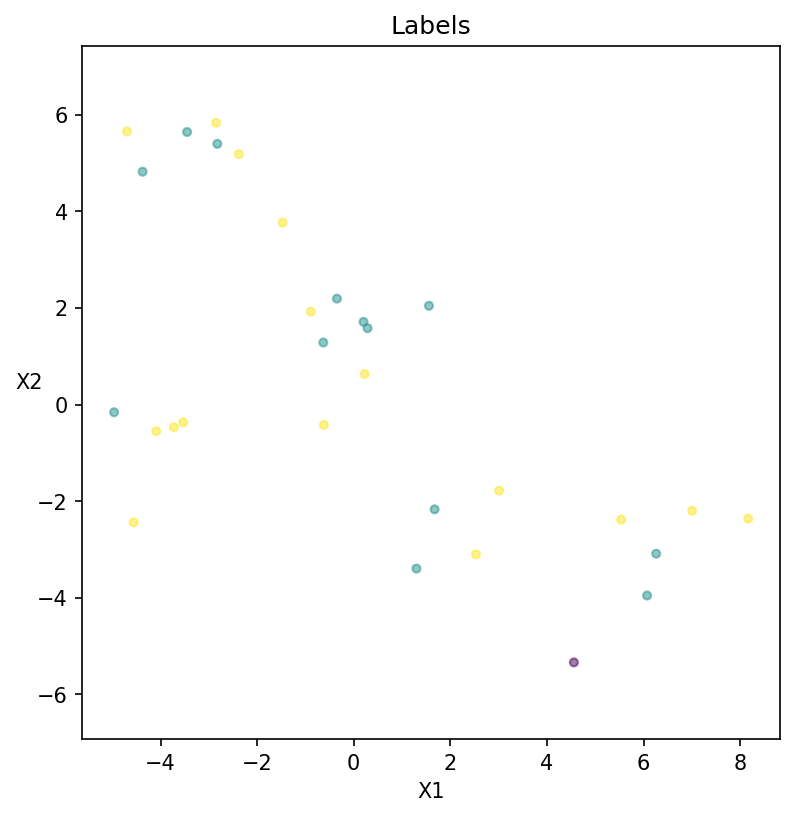

In [174]:
n = 30
K = 5
seed = 5
l = 3
alpha = 1/2
beta = [1,1,1]
lower = 2
upper = n
M = 1e5
np.random.seed(seed)
labels = np.random.choice([0,1,2], p= [0.1,0.2,0.7], size=n)
print(labels)

X,Y,archetype = synthetic_data(n,K,seed)

fig, ax = plt.subplots(figsize=(6,6), dpi=150)
ax.scatter(X[:,0], X[:,1], c=labels, s=15, alpha=0.5, linewidth=1.0)

plt.title("Labels")
plt.xlabel('X1')
plt.ylabel('X2').set_rotation(0)
plt.axis('equal')

centers, dist, q, clusters, clusters_assign, t = initialize_clusters(X,K,l,alpha,beta,n,labels,M,lower,upper)

(-5.616949342878313, 8.823006340340918, -5.897258019622055, 6.391378937925549)

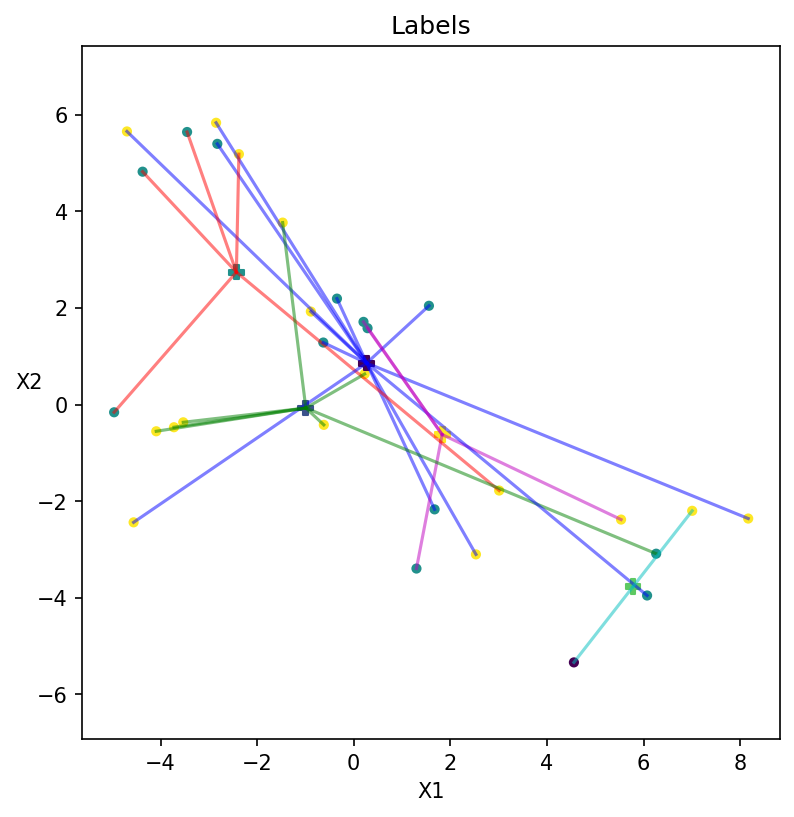

In [175]:
fig, ax = plt.subplots(figsize=(6,6), dpi=150)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
ax.scatter(X[:,0], X[:,1], c=labels, s=15, linewidth=1.0)
xc = [i[0] for i in centers]
yc = [i[1] for i in centers]
ax.scatter(xc, yc, marker='P', c=list(range(K)), s=50, linewidth=1.0)
for i in range(n):
  x = (X[i,0],centers[clusters_assign[i]][0])
  y = (X[i,1],centers[clusters_assign[i]][1])
  ax.plot(x,y, c = colors[clusters_assign[i]], alpha = 0.5)

plt.title("Labels")
plt.xlabel('X1')
plt.ylabel('X2').set_rotation(0)
plt.axis('equal')

In [193]:
n = 10
K = 5
seed = 5
l = 3
alpha = 1/2
beta = [1,1,1]
lower = 2
upper = n
M = 1e5
labels = np.random.choice([0,1,2], p= [0.1,0.2,0.7], size=n)

X,Y,archetype = synthetic_data(n,K,seed)
centers, dist, q, clusters, clusters_assign, t = initialize_clusters(X,K,l,alpha,beta,n,labels,M,lower,upper)

print(t)

r = dist.copy()
s = clusters.copy()
m = K

s, r, t, masterobj, optimal_values_Z, optimal_centers, objectives = main_loop(200,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,X[:,0],X[:,1],centers)

Optimizing Cluster Centers: 100%|██████████| 300/300 [00:00<00:00, 15424.02it/s, Status=SUCCESS]

Set parameter MIPFocus to value 1
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[rosetta2] - Darwin 23.2.0 23C71)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 38 rows, 65 columns and 330 nonzeros
Model fingerprint: 0x5fbe1f8f
Variable types: 0 continuous, 65 integer (65 binary)
Coefficient statistics:
  Matrix range     [5e-01, 1e+05]
  Objective range  [0e+00, 0e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+05]
Found heuristic solution: objective 0.0000000

Explored 0 nodes (0 simplex iterations) in 0.00 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 0 

Optimal solution found (tolerance 1.00e-04)
Best objective 0.000000000000e+00, best bound 0.000000000000e+00, gap 0.0000%
Objective: 0.0
Z[0,0] = 1.0
Z[0,1] = 0.0
Z[0,2] = 0.0
Z[0,3] = 0.0
Z[0,4] = 0.0
Z[1,0] = 1.0
Z[1,1] = 0.0
Z[1,2] = 0.0
Z[1,3] = 0.0
Z[1,4] = 0.0
Z[2,0] = 0.0
Z[2,1]

Objective: 96.673625512126
Z = 1.0
Z = 1.0
Z = 1.0
Z = 1.0
Z = 1.0
Dual values:
Constraint1_0: 19.830021717937548
Constraint1_1: 0.0
Constraint1_2: 4.645195593362231
Constraint1_3: 24.142226727740287
Constraint1_4: 43.83794724328108
Constraint1_5: 4.2182342298048585
Constraint1_6: 0.0
Constraint1_7: 0.0
Constraint1_8: 0.0
Constraint1_9: 0.0
Constraint2_0: 0.0
Constraint2_1: 0.0
Constraint2_2: 0.0
Constraint3: 0.0
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[rosetta2] - Darwin 23.2.0 23C71)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 15 rows, 25 columns and 63 nonzeros
Model fingerprint: 0x14b42f8b
Model has 10 quadratic constraints
Variable types: 12 continuous, 13 integer (13 binary)
Coefficient statistics:
  Matrix range     [5e-01, 1e+05]
  QMatrix range    [1e+00, 1e+00]
  QLMatrix range   [2e-01, 1e+05]
  Objective range  [1e+00, 4e+01]
  Bounds range     [1e+00, 1e+02]
  RHS range        [2e+00

[2, 4, 4, 1, 1, 0, 0, 3, 3, 2]
[(-1.1556342293525124, 3.02078039994661), (6.3137394494160315, -3.0120473310133895), (0.7974702504784681, -0.2816070029790457), (-0.3688693557482771, 1.9556041775446737), (-4.240603349479003, 0.37309329479068554)]


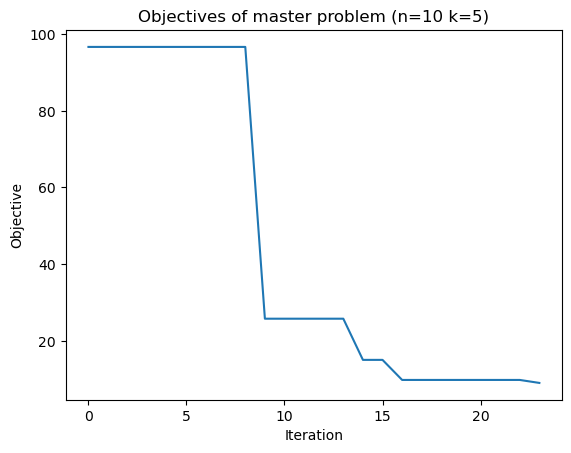

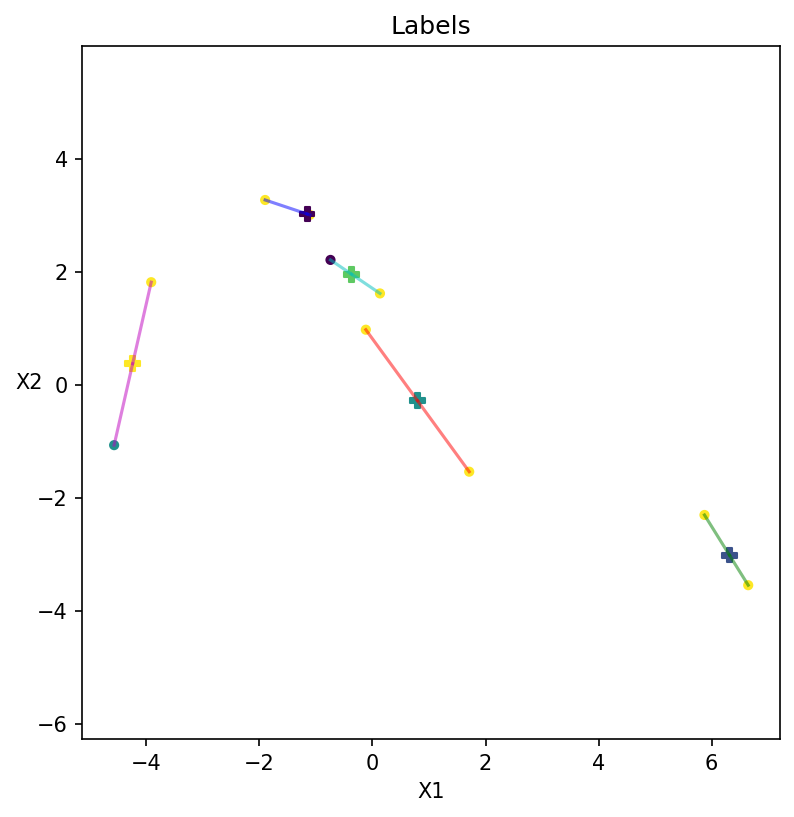

In [194]:
visualize_result(s, r, t, n, K, masterobj, optimal_values_Z, centers, objectives)

In [195]:
n = 30
K = 5
seed = 5
l = 3
alpha = 1/2
beta = [1,2,1]
lower = 2
upper = n
M = 1e5
labels = np.random.choice([0,1,2], p= [0.1,0.2,0.7], size=n)

X,Y,archetype = synthetic_data(n,K,seed)
centers, dist, q, clusters, t = initialize_clusters(X,K,l,alpha,beta,n,labels,M,lower,upper)

r = dist.copy()
s = clusters_random.copy()
m = K

s, r, t, masterobj, optimal_values_Z, centers, objectives = main_loop(200,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,X[:,0],X[:,1],centers)

Optimizing Cluster Centers: 100%|██████████| 300/300 [00:00<00:00, 15869.68it/s, Status=SUCCESS]

Set parameter MIPFocus to value 1


Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[rosetta2] - Darwin 23.2.0 23C71)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 58 rows, 165 columns and 930 nonzeros
Model fingerprint: 0x2dcf1c1c
Variable types: 0 continuous, 165 integer (165 binary)
Coefficient statistics:
  Matrix range     [5e-01, 1e+05]
  Objective range  [0e+00, 0e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+05]
Found heuristic solution: objective 0.0000000

Explored 0 nodes (0 simplex iterations) in 0.00 seconds (0.00 work units)
Thread count was 1 (of 8 available processors)

Solution count 1: 0 

Optimal solution found (tolerance 1.00e-04)
Best objective 0.000000000000e+00, best bound 0.000000000000e+00, gap 0.0000%
Objective: 0.0
Z[0,0] = 1.0
Z[0,1] = 0.0
Z[0,2] = 0.0
Z[0,3] = 0.0
Z[0,4] = 0.0
Z[1,0] = 1.0
Z[1,1] = 0.0
Z[1,2] = 0.0
Z[1,3] = 0.0
Z[1,4] = 0.0
Z[2,0] = 0.0
Z[2,1] = 0.0
Z[2,2] = 0.0
Z[2,3] = 0.

ValueError: too many values to unpack (expected 5)

In [25]:
len(s)

204

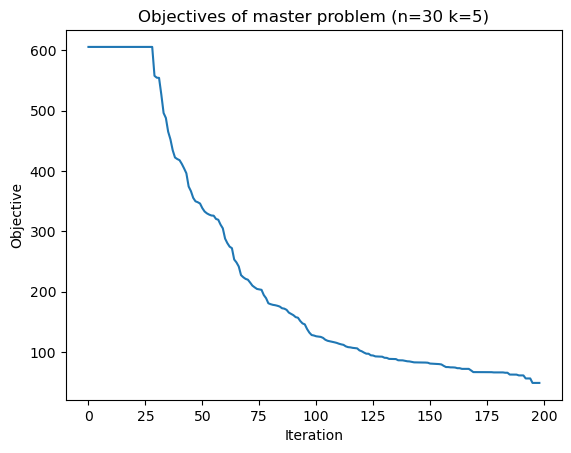

In [31]:
plt.plot(objectives)
plt.xlabel("Iteration")
plt.ylabel("Objective")
plt.title("Objectives of master problem (n=30 k=5)")
plt.show()

In [27]:
optimal_clusters = []
optimal_labels = [0 for _ in range(n)]
optimal_centers = []
counter = 0
for i,clust in enumerate(optimal_values_Z):
  if clust == 1:
    optimal_clusters.append(s[i])
    for j in range(n):
      if s[i][j] == 1:
        optimal_labels[j] = counter
    counter += 1
    optimal_centers.append(centers[i])


print(optimal_labels)
print(optimal_centers)

[4, 4, 4, 4, 0, 0, 0, 0, 0, 1, 4, 1, 4, 1, 1, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3]
[(-4.171432506236237, -0.7984910149490323), (7.082242341456976, -2.83832489632634), (-3.152687523934858, 5.0513516448261), (-0.11698843687211946, 1.275732967368749), (3.2150233058112967, -3.013622046984916)]


(-5.616949342878313, 8.823006340340918, -5.897258019622055, 6.391378937925549)

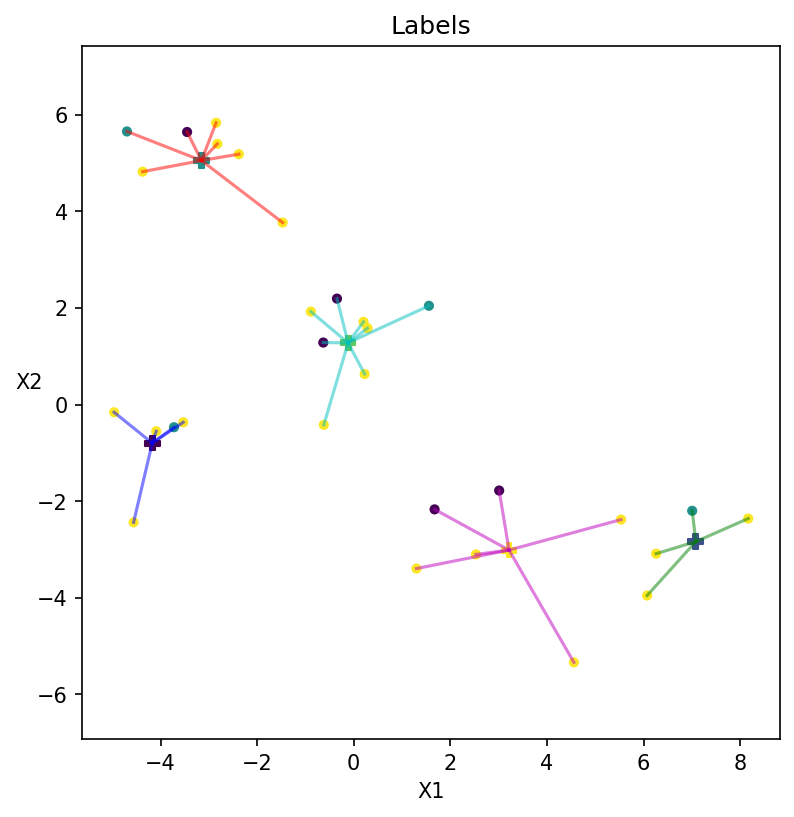

In [28]:
fig, ax = plt.subplots(figsize=(6,6), dpi=150)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
ax.scatter(X[:,0], X[:,1], c=labels, s=15, linewidth=1.0)
xc = [i[0] for i in optimal_centers]
yc = [i[1] for i in optimal_centers]
ax.scatter(xc, yc, marker='P', c=list(range(K)), s=50, linewidth=1.0)
for i in range(n):
  x = (X[i,0],optimal_centers[optimal_labels[i]][0])
  y = (X[i,1],optimal_centers[optimal_labels[i]][1])
  ax.plot(x,y, c = colors[optimal_labels[i]], alpha = 0.5)

plt.title("Labels")
plt.xlabel('X1')
plt.ylabel('X2').set_rotation(0)
plt.axis('equal')

In [196]:
n = 60
K = 5
seed = 5
l = 3
alpha = 1/4
labels = np.random.choice([0,1,2], p= [0.1,0.2,0.7], size=n)

X,Y,archetype = synthetic_data(n,K,seed)
centers, dist, q, clusters_random, t = initialize_clusters_random(X,K,l,alpha,n,labels)

r = dist.copy()
s = clusters_random.copy()
beta = [1,1,0]
M = 1e5
lower = 2
upper = n
m = K

s, r, t, masterobj, optimal_values_Z, centers, objectives = main_loop(200,K,n,m,l,r,beta,s,t,alpha,M,q,lower,upper,X[:,0],X[:,1],centers)

Optimizing Cluster Centers: 100%|██████████| 300/300 [00:00<00:00, 15422.69it/s, Status=SUCCESS]

Iteration #1
s: [[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0]]
r: [204.9159006554544, 342.16460826901033, 407.4176149045461, 179.4705143

Objective: 1288.1106536713744
Z = 1.0
Z = 1.0
Z = 1.0
Z = 1.0
Z = 1.0
Dual values:
Constraint1_0: 342.16460826901033
Constraint1_1: 179.4705143029505
Constraint1_2: 0.0
Constraint1_3: 0.0
Constraint1_4: 154.14201553941308
Constraint1_5: 0.0
Constraint1_6: 0.0
Constraint1_7: 0.0
Constraint1_8: 204.9159006554544
Constraint1_9: 0.0
Constraint1_10: 407.4176149045461
Constraint1_11: 0.0
Constraint1_12: 0.0
Constraint1_13: 0.0
Constraint1_14: 0.0
Constraint1_15: 0.0
Constraint1_16: 0.0
Constraint1_17: 0.0
Constraint1_18: 0.0
Constraint1_19: 0.0
Constraint1_20: 0.0
Constraint1_21: 0.0
Constraint1_22: 0.0
Constraint1_23: 0.0
Constraint1_24: 0.0
Constraint1_25: 0.0
Constraint1_26: 0.0
Constraint1_27: 0.0
Constraint1_28: 0.0
Constraint1_29: 0.0
Constraint1_30: 0.0
Constraint1_31: 0.0
Constraint1_32: 0.0
Constraint1_33: 0.0
Constraint1_34: 0.0
Constraint1_35: 0.0
Constraint1_36: 0.0
Constraint1_37: 0.0
Constraint1_38: 0.0
Constraint1_39: 0.0
Constraint1_40: 0.0
Constraint1_41: 0.0
Constraint1_42:

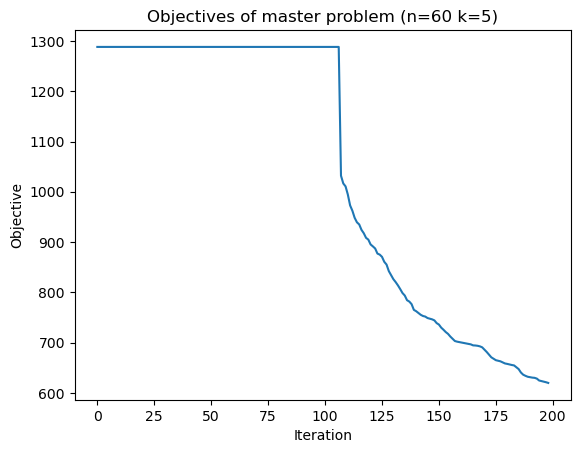

In [197]:
plt.plot(objectives)
plt.xlabel("Iteration")
plt.ylabel("Objective")
plt.title("Objectives of master problem (n=60 k=5)")
plt.show()

In [99]:
optimal_clusters = []
optimal_labels2 = [0 for _ in range(n)]
optimal_centers2 = []
counter = 0
for i,clust in enumerate(optimal_values_Z):
  if clust == 1:
    optimal_clusters.append(s[i])
    for j in range(n):
      if s[i][j] == 1:
        optimal_labels2[j] = counter
    counter += 1
    optimal_centers2.append(centers[i])


print(optimal_labels2)
print(optimal_centers2)

[4, 2, 0, 1, 2, 0, 4, 4, 0, 4, 4, 3, 2, 3, 1, 2, 0, 2, 1, 1, 2, 0, 4, 0, 3, 4, 2, 3, 0, 1, 0, 4, 2, 4, 0, 3, 2, 1, 0, 2, 4, 3, 2, 3, 0, 2, 1, 0, 3, 0, 2, 1, 4, 1, 4, 0, 1, 1, 1, 4]
[(0.2658189460378287, 0.17202376918592036), (0.7334401835317436, -0.30330819889454425), (-1.0608806119460987, 0.6655648300620712), (-0.6076731473928559, 1.397578683113501), (-0.5268896675106544, 0.3359829229017012)]


(-5.979954856145574, 8.143508014206194, -6.9470418674871635, 6.502027785243323)

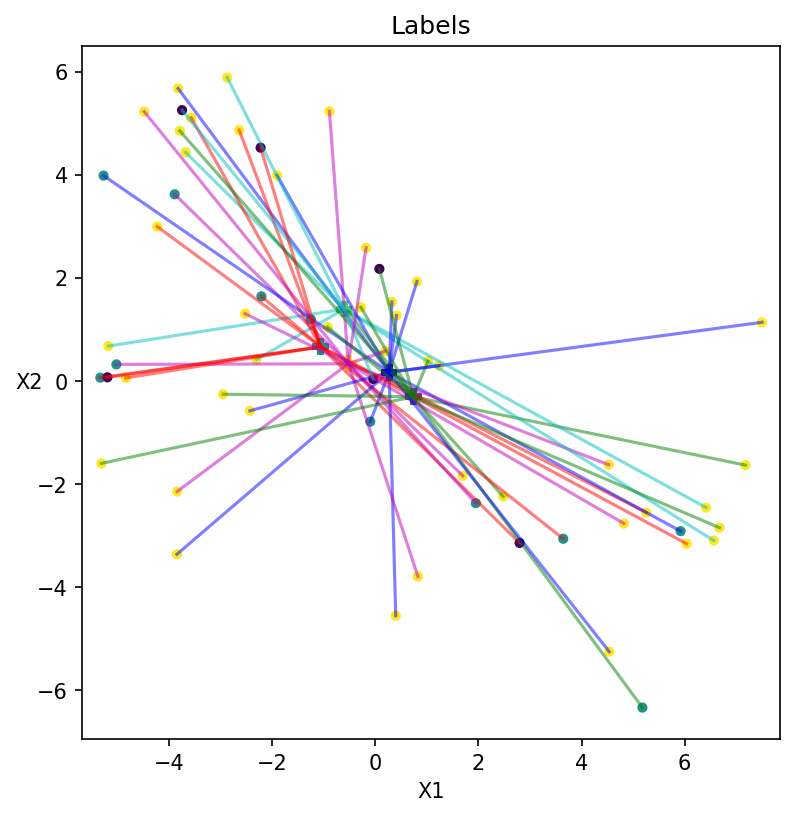

In [101]:
fig, ax = plt.subplots(figsize=(6,6), dpi=150)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
ax.scatter(X[:,0], X[:,1], c=labels, s=15, linewidth=1.0)
xc = [i[0] for i in optimal_centers2]
yc = [i[1] for i in optimal_centers2]
ax.scatter(xc, yc, marker='P', c=list(range(K)), s=50, linewidth=1.0)
for i in range(n):
  x = (X[i,0],optimal_centers2[optimal_labels2[i]][0])
  y = (X[i,1],optimal_centers2[optimal_labels2[i]][1])
  ax.plot(x,y, c = colors[optimal_labels2[i]], alpha = 0.5)

plt.title("Labels")
plt.xlabel('X1')
plt.ylabel('X2').set_rotation(0)
plt.axis('equal')

In [177]:
def visualize_result(s, r, t, n, K, masterobj, optimal_values_Z, centers, objectives):
  optimal_clusters = []
  optimal_clusters_assign = [0 for _ in range(n)]
  optimal_centers = []
  counter = 0
  for i,clust in enumerate(optimal_values_Z):
    if clust == 1:
      optimal_clusters.append(s[i])
      for j in range(n):
        if s[i][j] == 1:
          optimal_clusters_assign[j] = counter
      counter += 1
      optimal_centers.append(centers[i])

  print(optimal_clusters_assign)
  print(optimal_centers)

  plt.plot(objectives)
  plt.xlabel("Iteration")
  plt.ylabel("Objective")
  plt.title("Objectives of master problem (n="+str(n)+" k="+str(K)+")")
  plt.show()
  plt.close()
  
  fig, ax = plt.subplots(figsize=(6,6), dpi=150)
  colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
  ax.scatter(X[:,0], X[:,1], c=labels, s=15, linewidth=1.0)
  xc = [i[0] for i in optimal_centers]
  yc = [i[1] for i in optimal_centers]
  ax.scatter(xc, yc, marker='P', c=list(range(K)), s=50, linewidth=1.0)
  for i in range(n):
    x = (X[i,0],optimal_centers[optimal_clusters_assign[i]][0])
    y = (X[i,1],optimal_centers[optimal_clusters_assign[i]][1])
    ax.plot(x,y, c = colors[optimal_clusters_assign[i]], alpha = 0.5)

  plt.title("Labels")
  plt.xlabel('X1')
  plt.ylabel('X2').set_rotation(0)
  plt.axis('equal')
  
  plt.show()